In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# datasets
from diffusion_curvature.datasets import sphere, torus

import os
os.environ["GEOMSTATS_BACKEND"] = "pytorch"

# models
import torch
from autometric.autoencoders import DerrickTheAutoencoder


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# 
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 3b PHATE Conditioned Embedding Analysis

One potential use of AUTOMETRIC is assessing the fidelity of embedding techniques to the manifold. One can train the autoencoder to learn a latent space whose euclidean distances correspond to, e.g., PHATE distances. By analyzing the *encoder pullback metric*, we can gauge how accurately the distances represent the manifold.

Inevitably, this representation will be poor; any high-dimensional (or even low-dimensional but curved) manifold cannot represent its pairwise distances accurately in a low dimensional euclidean space. Just take the sphere! It's hopeless; any projection will, like the Mercador, have some equivalent of making greenland enormous.

Vut we are three-dimensional euclidean creatures, so, like it or not, we'll continue to look at 2d euclidean visualizations. Autometric can at least tell us which map projections are least horrible.

*How do we propose to do this?* This notebook evaluates two such methods:

0. Assessing the rank of the nxn metric tensor from the encoder pullback.
1. Comparing the scalar curvature derived from the pullback metric to the real (or estimated) scalar curvature.

# Approximating a PHATE embedding of the sphere

Computing PHATE with phate_decay=40 and self.n_neighbors=5
X is tensor([[ 0.6913,  0.0509, -0.7208],
        [-0.2432,  0.3534, -0.9033],
        [-0.5478,  0.6863, -0.4784],
        ...,
        [-0.3140, -0.9329,  0.1763],
        [-0.0079, -0.2478, -0.9688],
        [-0.0636, -0.8121, -0.5800]])
Calculating PHATE...
  Running PHATE on 2000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculating affinities...
  Calculated graph and diffusion operator in 0.02 seconds.
  Calculating optimal t...
    Automatically selected t = 20
  Calculated optimal t in 0.61 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.16 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.81 seconds.
Calculated PHATE in 3.60 seconds.


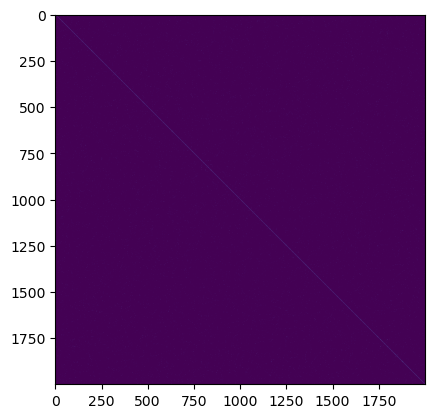

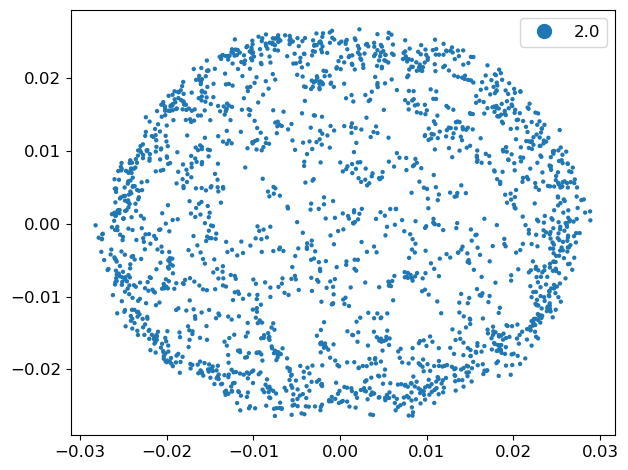

In [ ]:
from diffusion_curvature.datasets import sphere
import phate
# from FRED.datasets import double_helix, directed_swiss_roll_delayed, directed_sinh_branch, rnavelo, directed_circle, line_with_discontinuities
from FRED.data_processing import dataloader_from_ndarray, ManifoldWithVectorFieldV2
from torch.utils.data import DataLoader
from FRED.data_processing import ManifoldWithVectorField, ManifoldWithVectorFieldV2, FRED_collate
# choose correct dataset
num_nodes = 2000
X, labels = sphere(n=num_nodes)
flow = np.zeros_like(X)

# build dataset
from torch.utils.data import DataLoader
from functools import partial
ds = ManifoldWithVectorFieldV2(X, flow, labels, prior_embedding="PHATE", phate_gamma=1)
FRED_collate_with_dists = partial(FRED_collate,precomputed_distances = ds.precomputed_distances)
dataloader = DataLoader(ds, batch_size=64, shuffle=True, collate_fn=FRED_collate_with_dists)

In [ ]:
# initialize model parameters and layers
from FRED.embed import ManifoldFlowEmbedder
from FRED.trainers import save_embedding_visualization, visualize_points, Trainer
MFE = ManifoldFlowEmbedder(
            embedding_dimension=2,
            embedder_shape=[X.shape[1], 20, 10, 5, 2],
            device=device,
            sigma=5,
            flow_strength=1,
            smoothness_grid=True,
        )
loss_weights = {
            "distance regularization": 1,
            "smoothness": 0,
            "flow neighbor loss": 0,
            "contrastive loss v2": 0,
        }
print("using loss weights ",loss_weights)
visualization_functions = [
    visualize_points,
    # save_embedding_visualization # just save these, for use in gif making. No visualizations otherwise, to keep it tidy.
]
FREDtrainer = Trainer(
    FE = MFE, 
    loss_weights=loss_weights, 
    visualization_functions = visualization_functions, 
    device=device, 
    title = "PHATE conditioned embedding",
    data_type="Contrastive Flow",
    learning_rate=1e-3
    )

using loss weights  {'distance regularization': 1, 'smoothness': 0, 'flow neighbor loss': 0, 'contrastive loss v2': 0}


  0%|          | 0/500 [00:00<?, ?it/s]

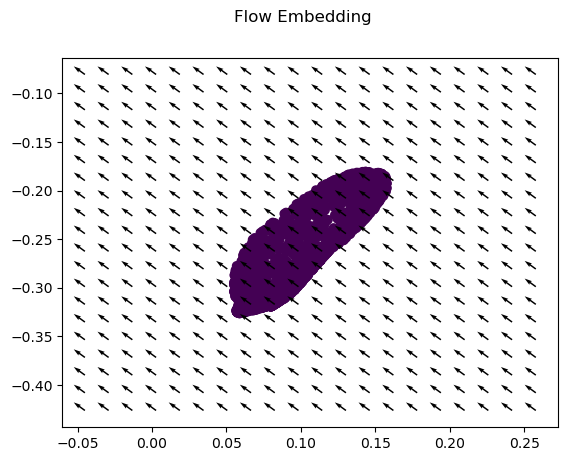

  2%|▏         | 10/500 [00:03<02:48,  2.91it/s]

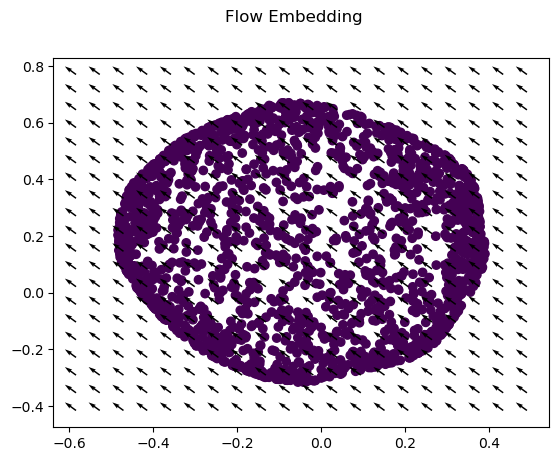

  4%|▍         | 20/500 [00:07<02:38,  3.03it/s]

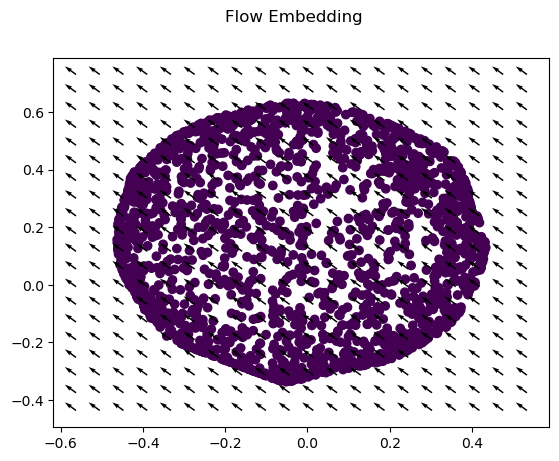

  6%|▌         | 30/500 [00:10<02:34,  3.04it/s]

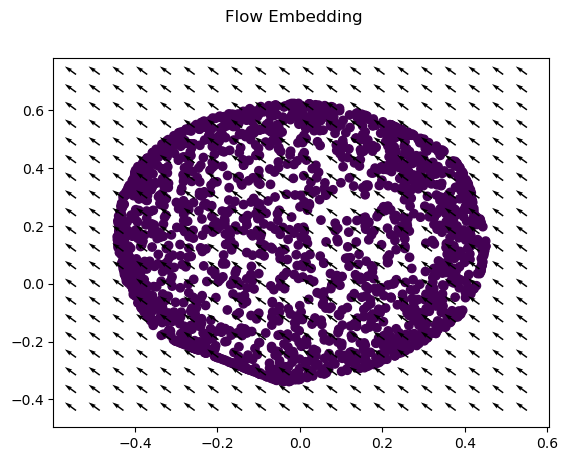

  8%|▊         | 40/500 [00:14<02:30,  3.06it/s]

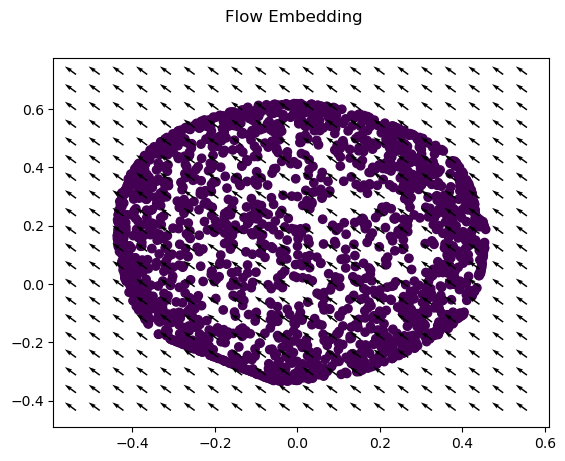

 10%|█         | 50/500 [00:17<02:25,  3.09it/s]

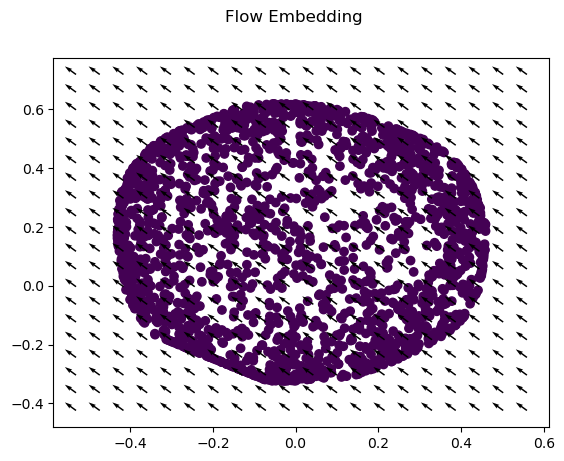

 12%|█▏        | 60/500 [00:20<02:23,  3.07it/s]

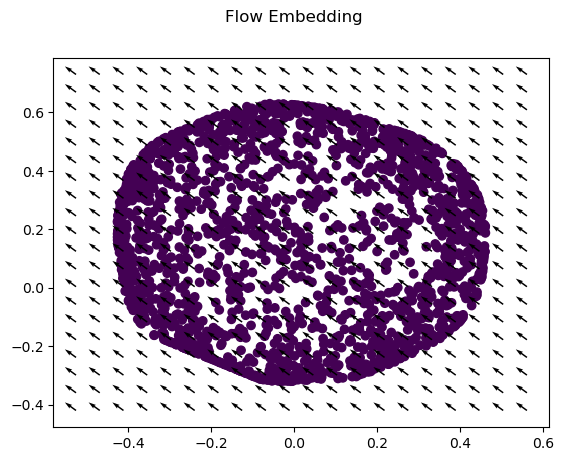

 14%|█▍        | 70/500 [00:24<02:23,  3.00it/s]

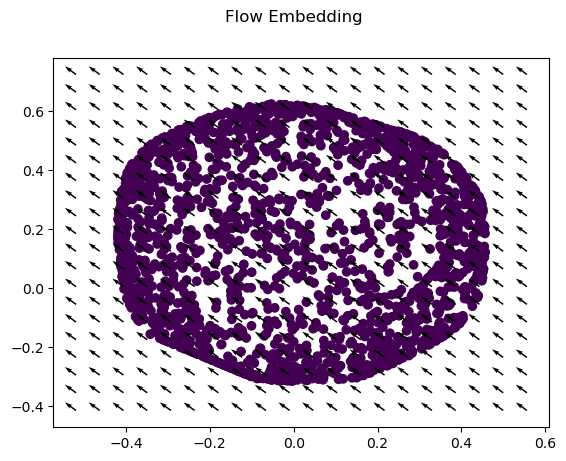

 16%|█▌        | 80/500 [00:27<02:19,  3.02it/s]

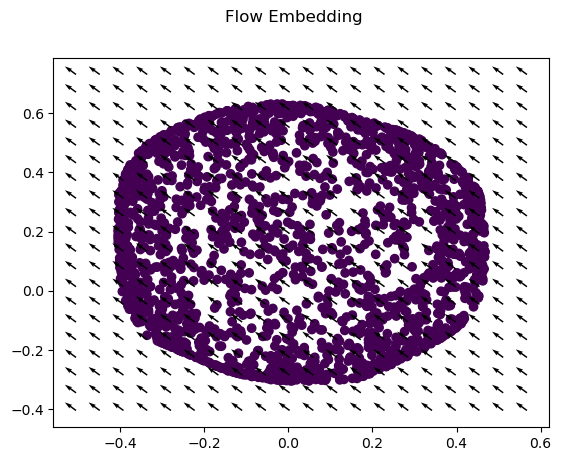

 18%|█▊        | 90/500 [00:30<02:14,  3.04it/s]

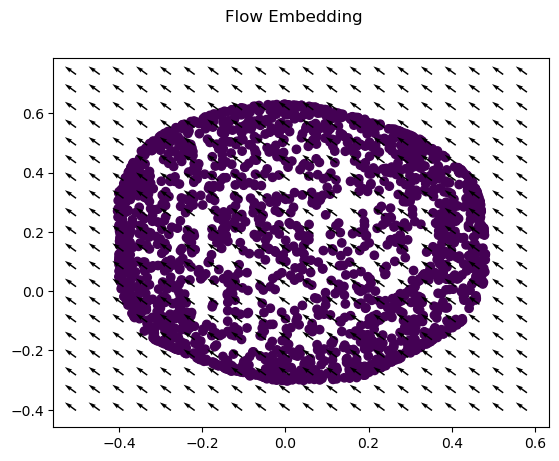

 20%|██        | 100/500 [00:34<02:13,  2.99it/s]

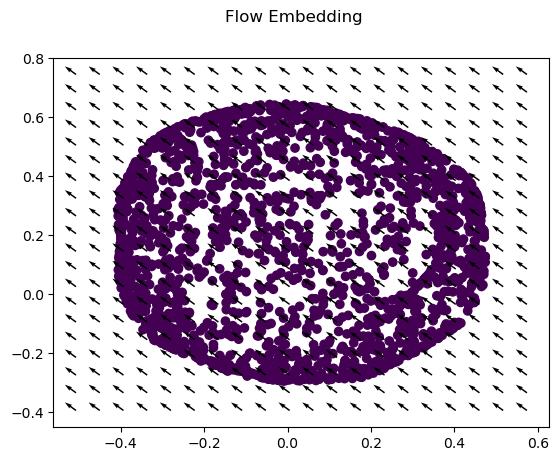

 22%|██▏       | 110/500 [00:37<02:11,  2.96it/s]

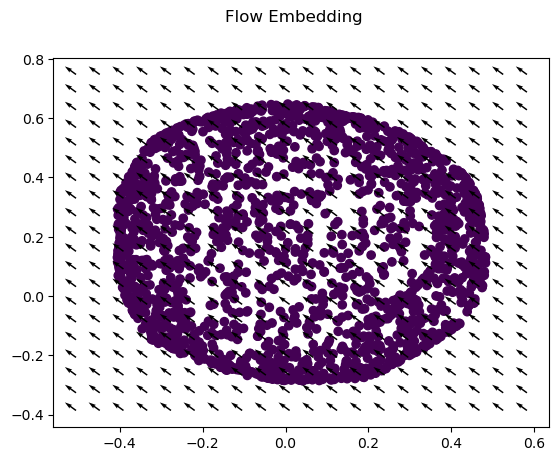

 24%|██▍       | 120/500 [00:41<02:06,  3.01it/s]

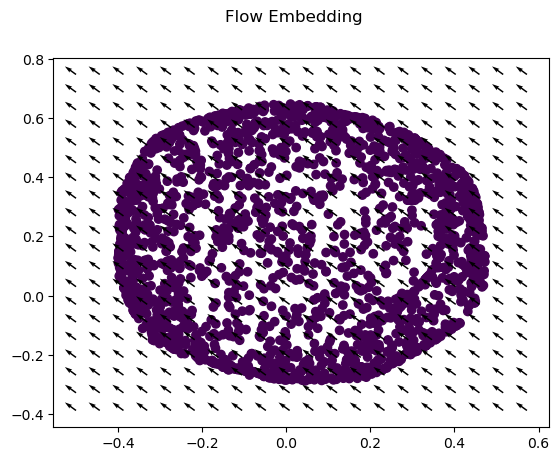

 26%|██▌       | 130/500 [00:44<02:08,  2.88it/s]

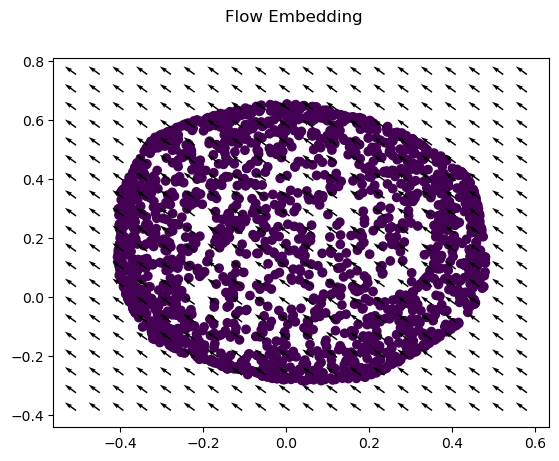

 28%|██▊       | 140/500 [00:48<02:00,  2.99it/s]

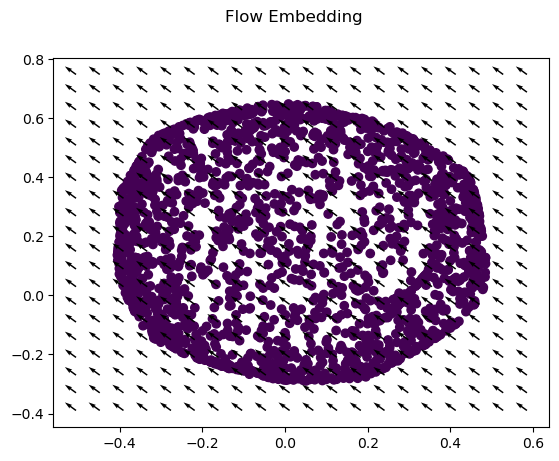

 30%|███       | 150/500 [00:51<01:56,  3.00it/s]

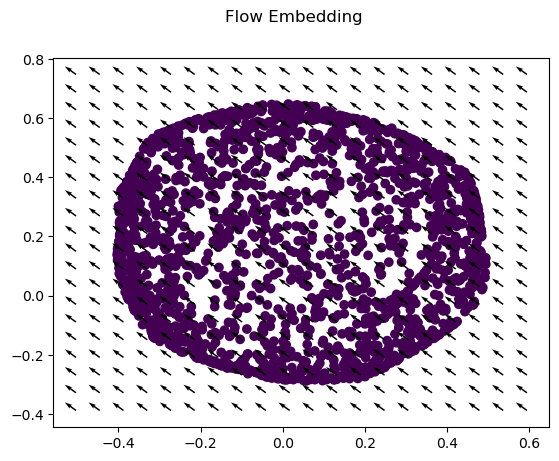

 32%|███▏      | 160/500 [00:55<01:55,  2.95it/s]

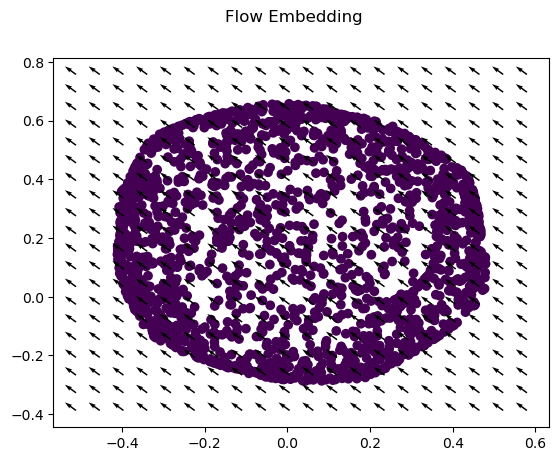

 34%|███▍      | 170/500 [00:58<01:49,  3.02it/s]

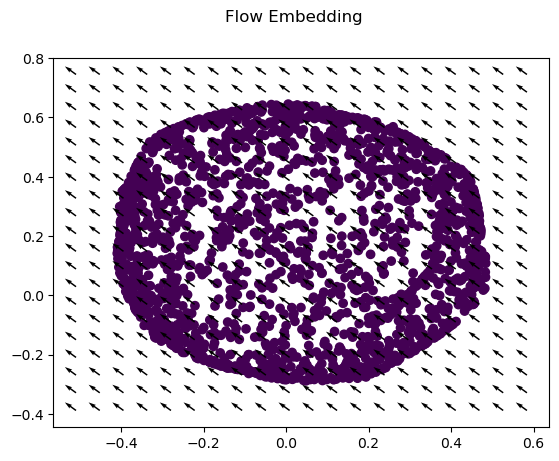

 36%|███▌      | 180/500 [01:02<01:46,  3.00it/s]

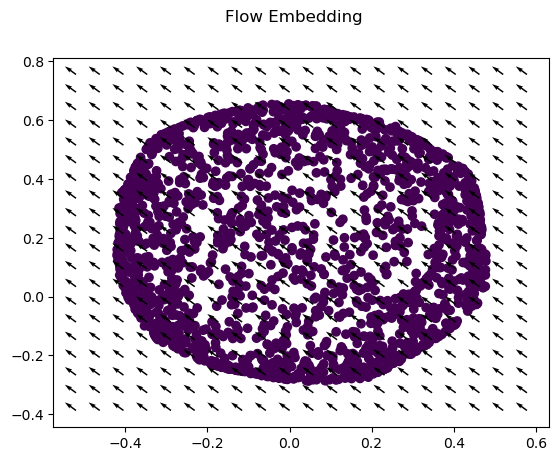

 38%|███▊      | 190/500 [01:05<01:44,  2.98it/s]

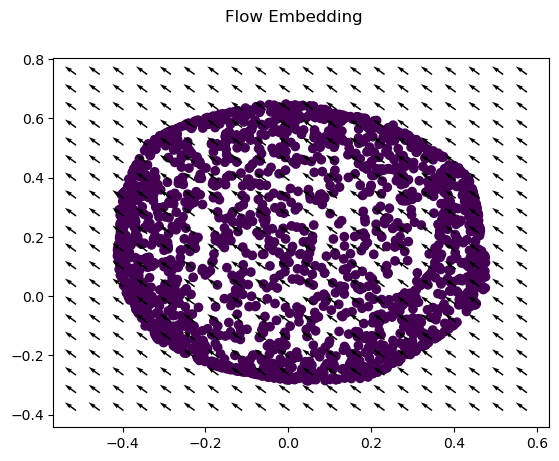

 40%|████      | 200/500 [01:09<01:43,  2.91it/s]

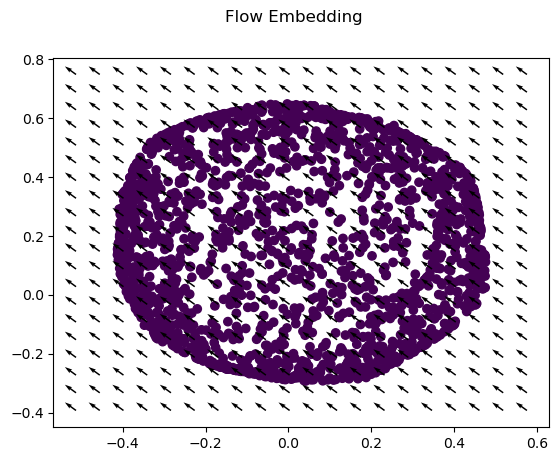

 42%|████▏     | 210/500 [01:12<01:39,  2.91it/s]

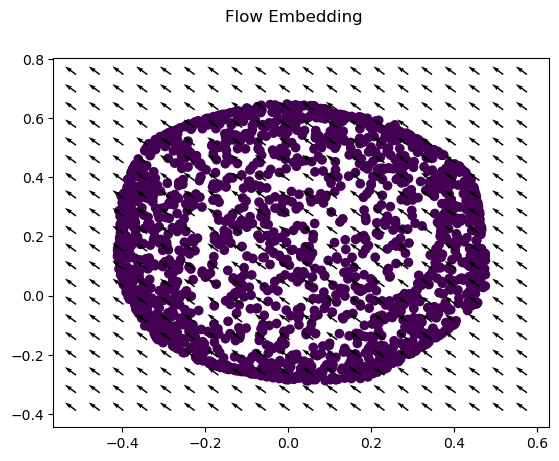

 44%|████▍     | 220/500 [01:16<01:33,  2.99it/s]

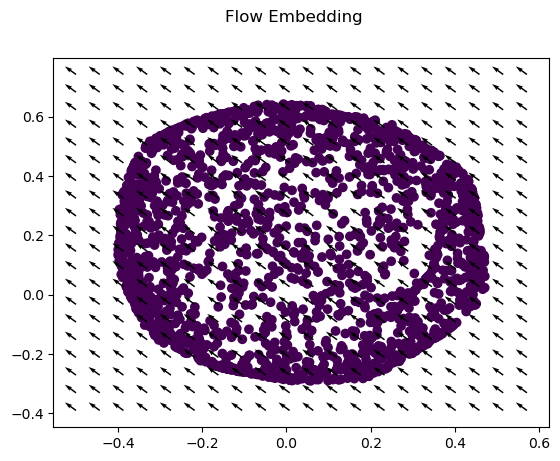

 46%|████▌     | 230/500 [01:19<01:31,  2.94it/s]

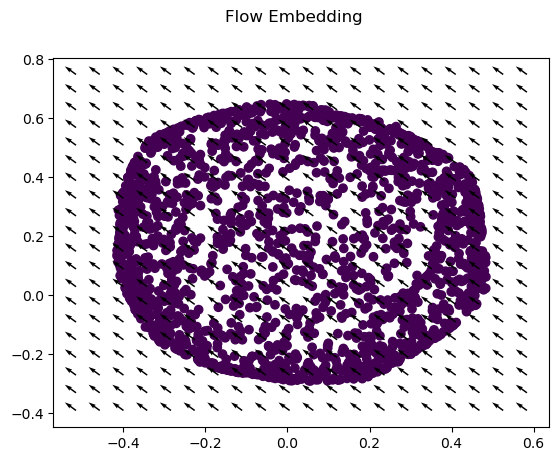

 48%|████▊     | 240/500 [01:23<01:27,  2.98it/s]

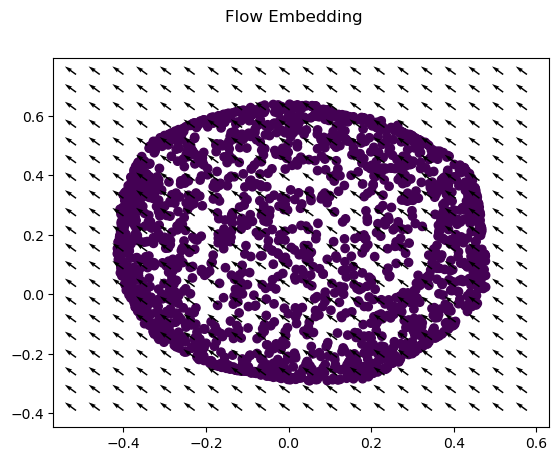

 50%|█████     | 250/500 [01:26<01:23,  3.01it/s]

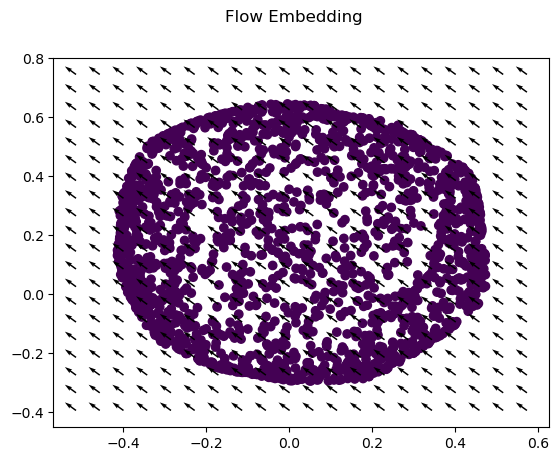

 52%|█████▏    | 260/500 [01:29<01:19,  3.02it/s]

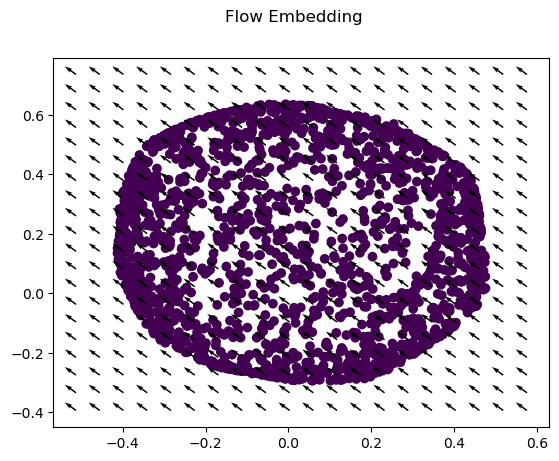

 54%|█████▍    | 270/500 [01:33<01:17,  2.99it/s]

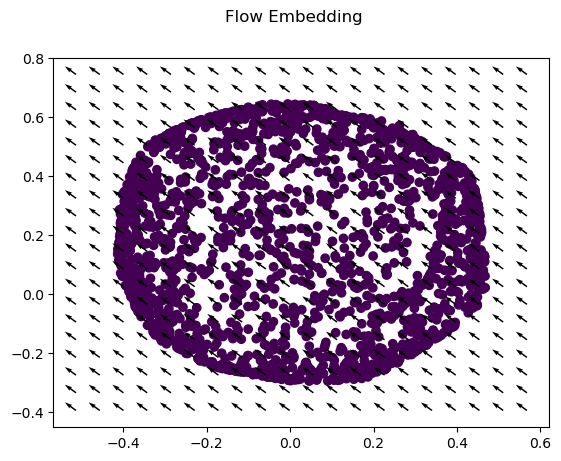

 56%|█████▌    | 280/500 [01:36<01:12,  3.05it/s]

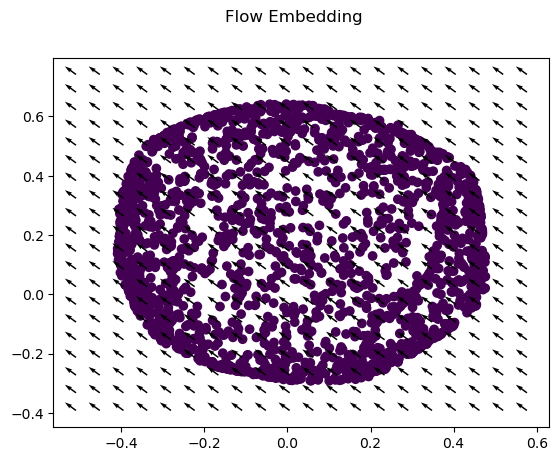

 58%|█████▊    | 290/500 [01:40<01:10,  2.97it/s]

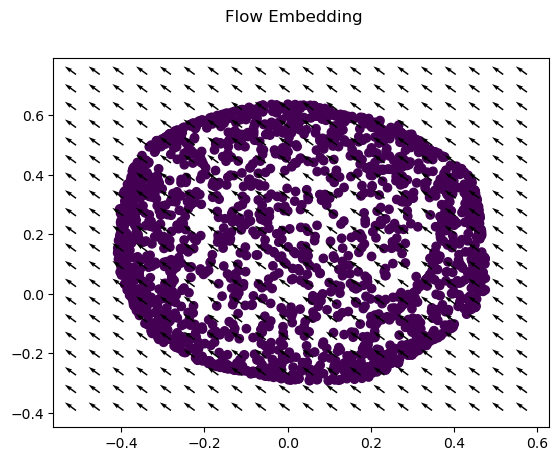

 60%|██████    | 300/500 [01:43<01:06,  2.99it/s]

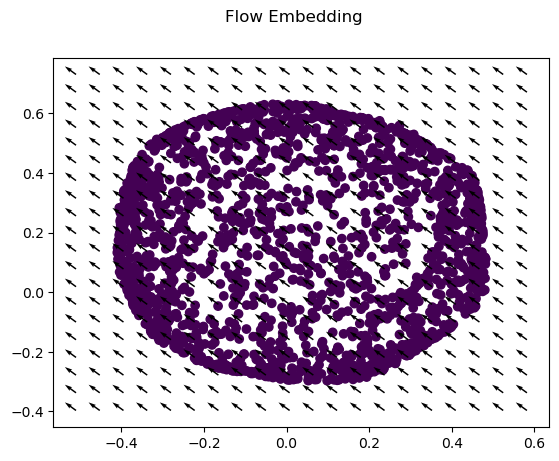

 62%|██████▏   | 310/500 [01:47<01:04,  2.96it/s]

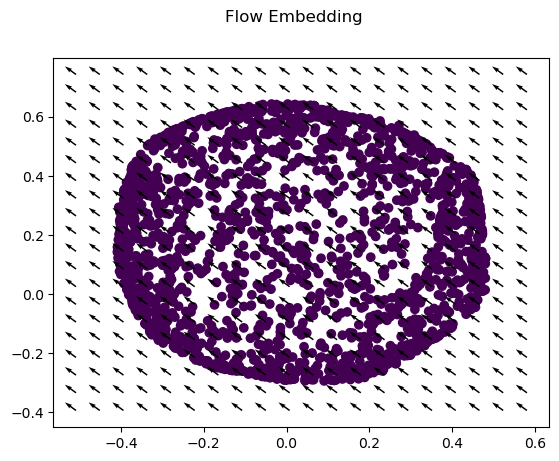

 64%|██████▍   | 320/500 [01:50<01:00,  2.98it/s]

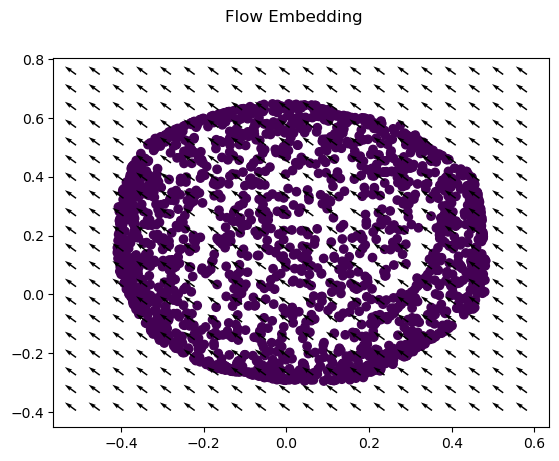

 66%|██████▌   | 330/500 [01:54<00:57,  2.98it/s]

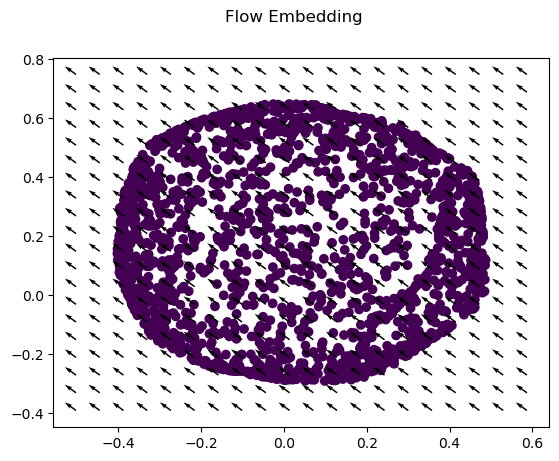

 68%|██████▊   | 340/500 [01:57<00:56,  2.82it/s]

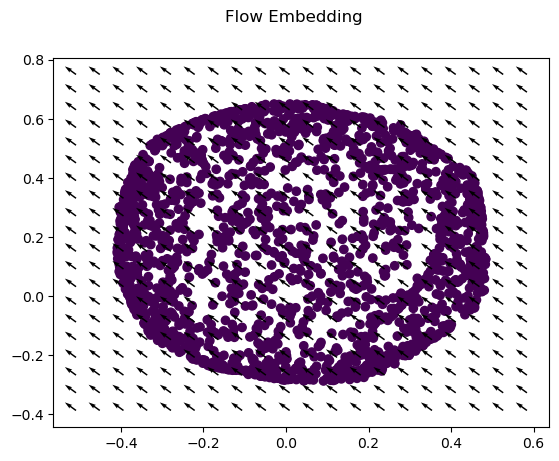

 70%|███████   | 350/500 [02:01<00:49,  3.03it/s]

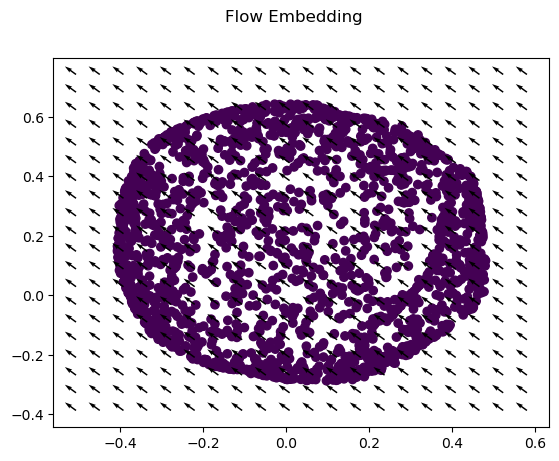

 72%|███████▏  | 360/500 [02:04<00:46,  3.00it/s]

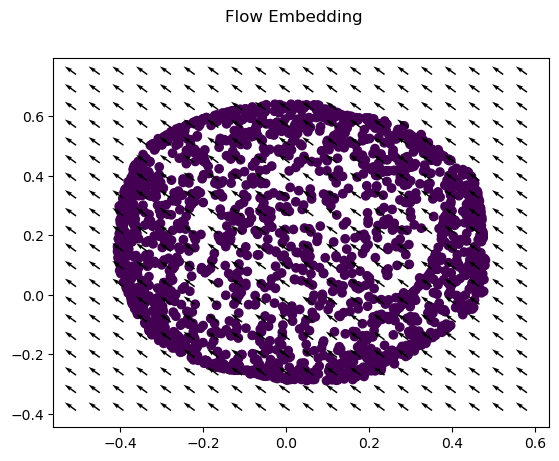

 74%|███████▍  | 370/500 [02:08<00:43,  3.00it/s]

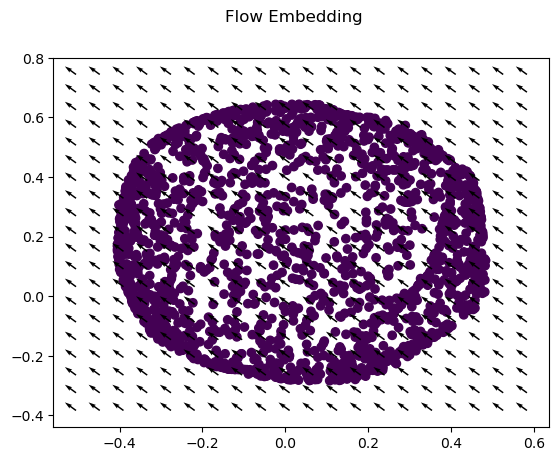

 76%|███████▌  | 380/500 [02:11<00:39,  3.04it/s]

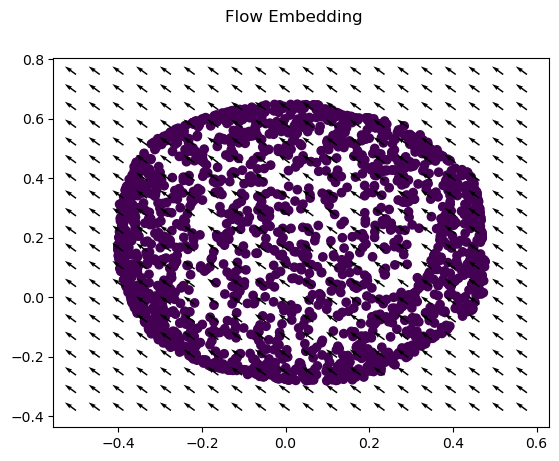

 78%|███████▊  | 390/500 [02:15<00:36,  2.99it/s]

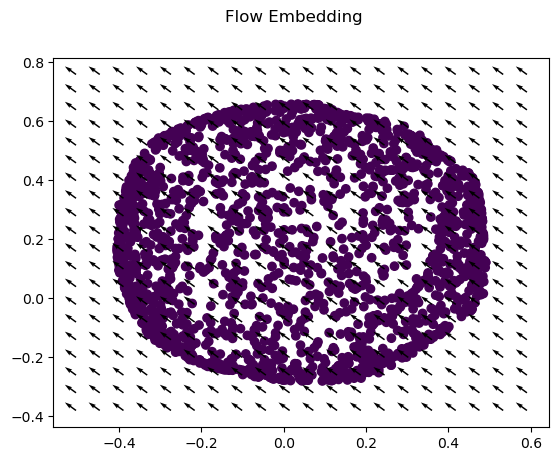

 80%|████████  | 400/500 [02:18<00:33,  2.95it/s]

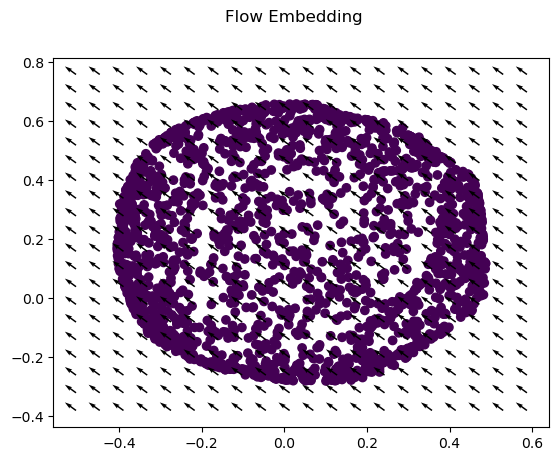

 82%|████████▏ | 410/500 [02:21<00:29,  3.05it/s]

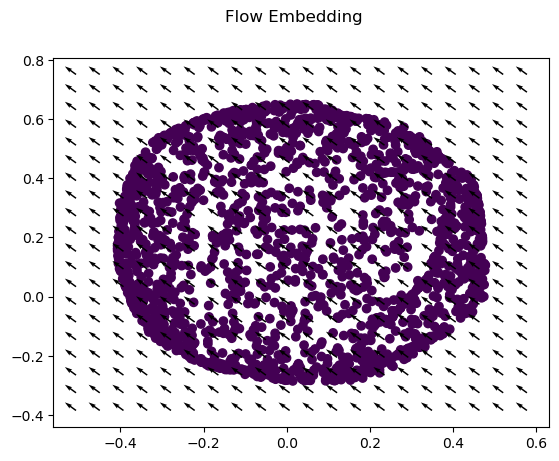

 84%|████████▍ | 420/500 [02:25<00:26,  3.02it/s]

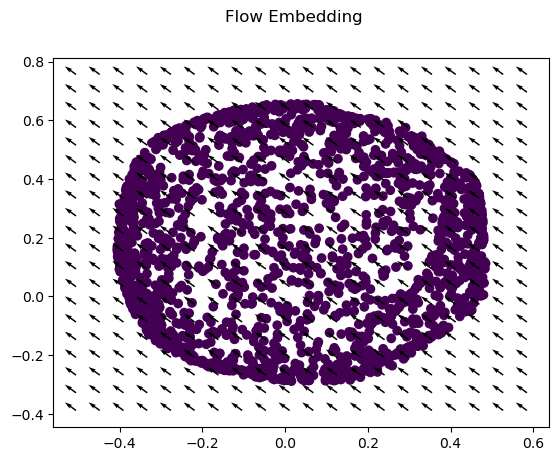

 86%|████████▌ | 430/500 [02:28<00:22,  3.05it/s]

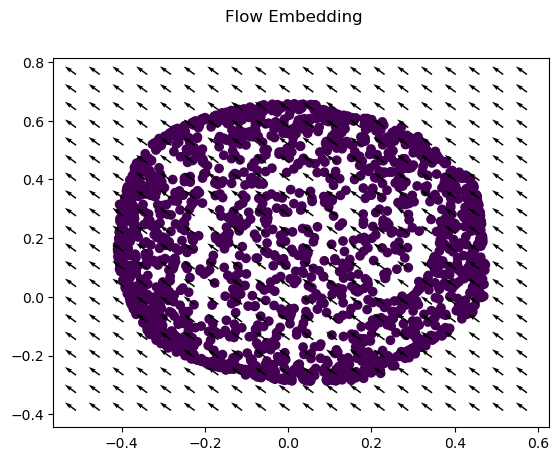

 88%|████████▊ | 440/500 [02:32<00:19,  3.02it/s]

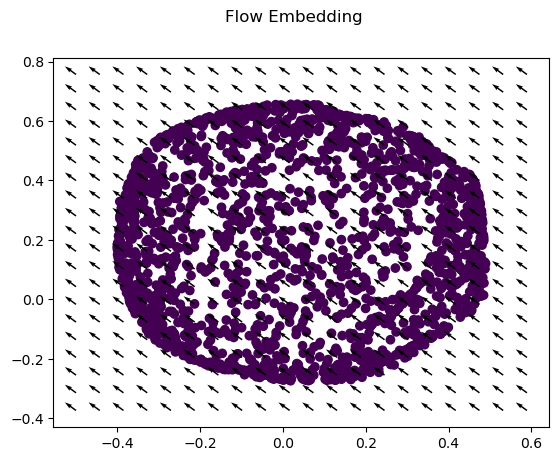

 90%|█████████ | 450/500 [02:35<00:16,  3.00it/s]

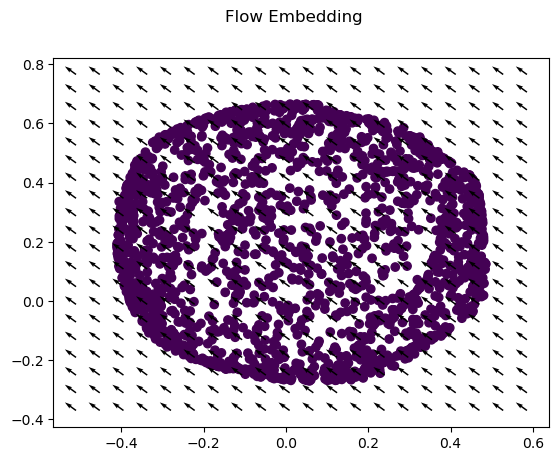

 92%|█████████▏| 460/500 [02:39<00:13,  2.88it/s]

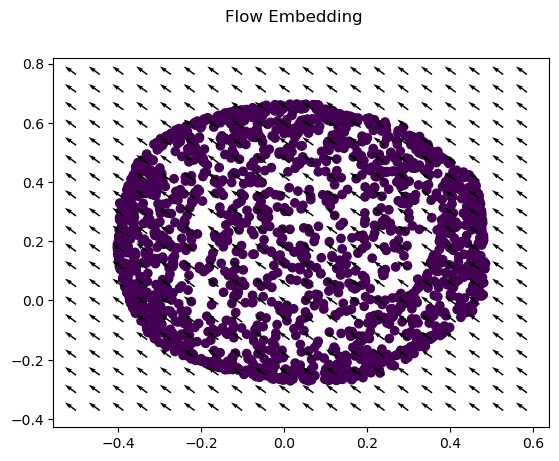

 94%|█████████▍| 470/500 [02:42<00:10,  2.84it/s]

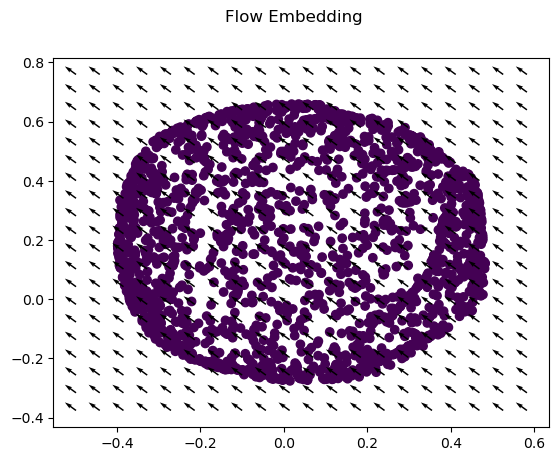

 96%|█████████▌| 480/500 [02:46<00:06,  2.97it/s]

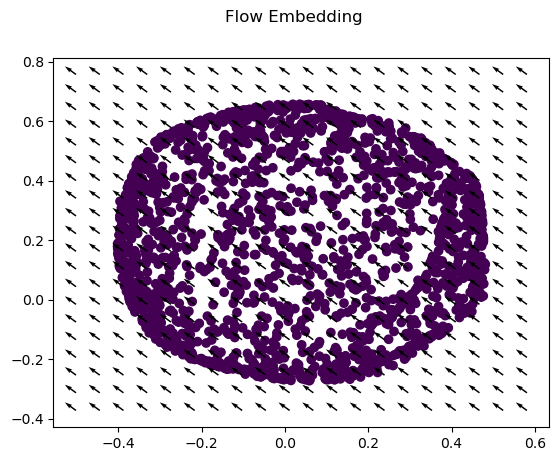

 98%|█████████▊| 490/500 [02:49<00:03,  3.01it/s]

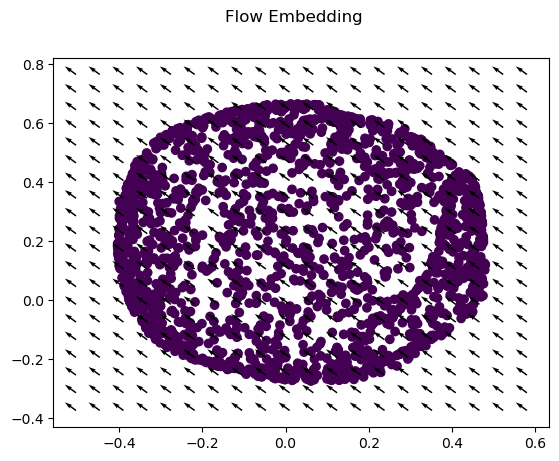

100%|██████████| 500/500 [02:53<00:00,  2.88it/s]


In [ ]:
#|hide
FREDtrainer.fit(dataloader, n_epochs=500)

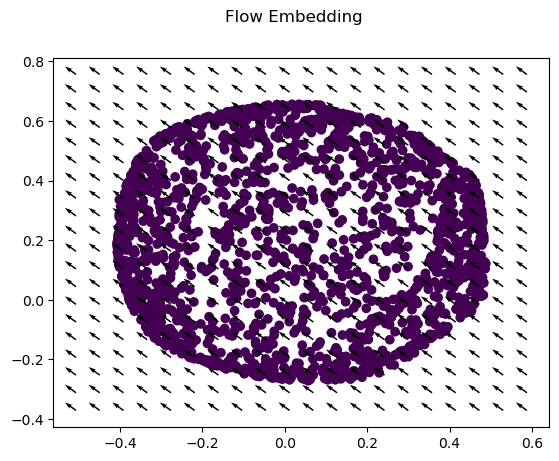

In [ ]:
FREDtrainer.visualize_embedding(use_streamlines=False)

# Metric Analysis of the Encoder

In [ ]:
map = FREDtrainer.FE.embedder

In [ ]:
X = torch.tensor(X, dtype=torch.float32).detach().to(device)

In [ ]:
import os
from autometric.metrics import PullbackMetric
from autometric.connections import LeviCivitaConnection
from autometric.manifolds import RiemannianManifold
pbm = PullbackMetric(2, map)
lcc = LeviCivitaConnection(2, pbm)
sphere_manifold = RiemannianManifold(2, (1, 1), metric=pbm, connection=lcc)

## Rank

In [ ]:
pbm.metric_matrix(base_point = X[10])

tensor([[ 0.3698,  0.2061, -0.0886],
        [ 0.2061,  0.1149, -0.0504],
        [-0.0886, -0.0504,  0.0497]], device='cuda:0', grad_fn=<MmBackward0>)

Text(0.5, 1.0, 'Singular values of metric matrix at point 10')

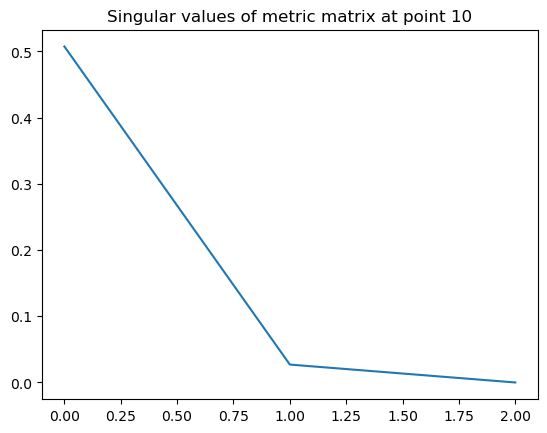

In [ ]:
# perform svd on the metric matrix and get the singular values
idx = 10
RM = pbm.metric_matrix(base_point = X[idx]).detach().cpu().numpy()
u, s, vh = np.linalg.svd(RM)
plt.plot(s)
plt.title("Singular values of metric matrix at point "+str(idx))

Oddly, this suggests that we only have one significant singular value.

## Curvature

In [ ]:
s = sphere_manifold.k_scalar_curvature(base_point = torch.tensor(X)[1300])
s

tensor(0., device='cuda:0', grad_fn=<ViewBackward0>)

The scalar curvature appears to be zero everywhere — the encoder pullback has just pulled the euclidean curvature into ambient space.